# Session 5: CNN on MNIST and YOLOv8

This notebook contains structured tasks for building a CNN on MNIST and experimenting with Ultralytics YOLOv8 (pretrained inference and a short training example).

**Instructions:**
- Complete all tasks directly in this notebook.
- Keep your code clear and well-commented.
- Use `%matplotlib inline` for visualizations.
- If you need to install packages (e.g., `ultralytics`), use `%pip` in a cell.
- When using external datasets, do NOT upload them to GitHub.

### ***DO NOT UPLOAD LARGE DATASETS OR MODEL WEIGHTS TO GITHUB***
<hr>

## Task 1: Convolutional Neural Network on MNIST — Build, Train, Evaluate, Visualize
Train a simple CNN on the MNIST handwritten digits dataset. After training, generate predictions on the test set, compare them to ground truth labels, and visualize a few results.

**Why this matters:**
- MNIST is a classic entry point for image classification and CNNs.
- You will practice the full workflow: data loading, model definition, training, evaluation, and visualization.

**Steps:**
- Load MNIST with appropriate transforms (normalize).
- Define a small CNN (Conv → ReLU → Pool → FC).
- Train for a few epochs (2–3 for demo).
- Evaluate on the test set and compute accuracy.
- Visualize several test images with predicted and true labels.

**Hint:** Use `torchvision.datasets.MNIST`, `DataLoader`, `nn.Conv2d`, `nn.ReLU`, `nn.MaxPool2d`, and `nn.CrossEntropyLoss`.

In [10]:
# TODO: Setup environment and imports
# - Import torch, torchvision, numpy, matplotlib
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data
from torch.autograd import Variable
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import random
# - Set random seeds and select device (cpu/cuda)
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# - Enable %matplotlib inline if needed
%matplotlib inline

In [11]:
# TODO: Load MNIST train/test datasets and create DataLoaders
# - Apply ToTensor and Normalize transforms
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])
# - Create train_loader and test_loader
trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
testset = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)

trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=1000, shuffle=False)


In [14]:
# TODO: Define a small CNN suitable for MNIST (1x28x28 input)
# - Use Conv2d, ReLU, MaxPool2d, Linear layers
# - Return logits for 10 classes
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        
        self.conv1 = nn.Conv2d(1, 16, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)

        self.fc1 = nn.Linear(32 * 7 * 7, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x
        

In [16]:
# TODO: Set up optimizer and loss function
# - Choose Adam/SGD and CrossEntropyLoss
model = CNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# TODO: Implement a short training loop (2–3 epochs)
epochs = 3
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct, total = 0, 0

    for images, labels in trainloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    # - Print loss/accuracy per epoch
    print(f"epoch [{epoch+1}/{epochs}] " 
        
        f"loss: {running_loss/len(trainloader):.4f} "

        f"train acc: {100*correct/total:.2f}%"
        )

epoch [1/3] loss: 0.2085 train acc: 93.71%
epoch [2/3] loss: 0.0526 train acc: 98.40%
epoch [3/3] loss: 0.0365 train acc: 98.84%


In [17]:
# TODO: Evaluate on the test set and compute accuracy
# - Switch model to eval mode
model.eval()
# - Accumulate correct predictions and total
correct, total = 0, 0
with torch.no_grad():
    for images, labels in testloader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_acc = 100 * correct / total
print(f"test acc: {test_acc:.2f}%")

test acc: 98.86%


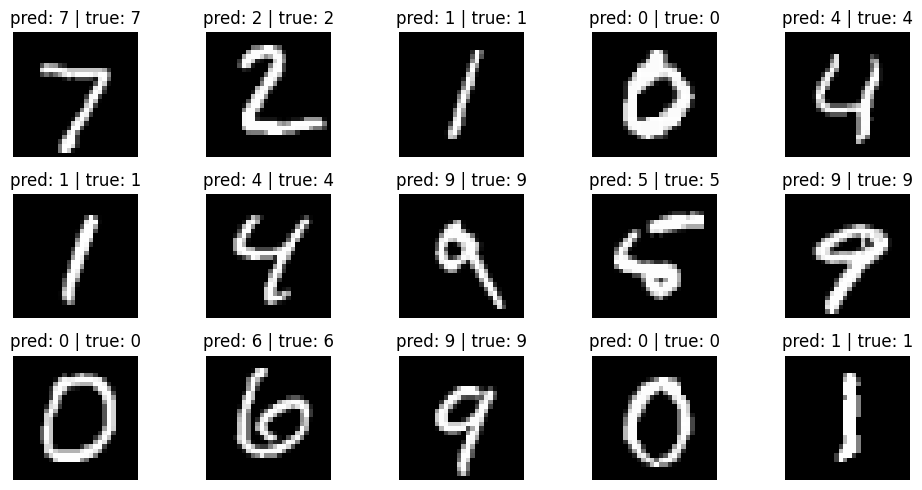

In [23]:
# TODO: Visualize a few test images with predicted and true labels
# - Sample a batch from test_loader
dataiterator = iter(testloader)
images, labels = next(dataiterator)
images, labels = images.to(device), labels.to(device)
outputs = model(images)
_, preds = torch.max(outputs, 1)

# - Run model and plot images with 'pred vs true' titles
images = images.cpu()
preds = preds.cpu()
labels = labels.cpu()

figs, axes = plt.subplots(3, 5, figsize=(10,5))
axes = axes.flatten()
for i, ax in enumerate(axes):
    img = images[i].squeeze().numpy()
    ax.imshow(img, cmap='gray')
    ax.set_title(f"pred: {preds[i].item()} | true: {labels[i].item()}")
    ax.axis('off')

plt.tight_layout()
plt.show()

## Task 2: YOLOv8 Pretrained Predictions (No Training)
Use a pretrained YOLOv8 model to run inference on any image of your choice and visualize detections.

**Why this matters:**
- Demonstrates transfer learning and using pretrained models for object detection.
- Learn how to quickly test a detector on real images.

**Steps:**
- Install `ultralytics` if not available.
- Load a YOLOv8 model (e.g., `yolov8n.pt`).
- Run predictions on an image path.
- Visualize the detections (boxes, labels, confidences).

**Hint:** Use `from ultralytics import YOLO`, `YOLO('yolov8n.pt')`, and `model.predict(source=...)`.

In [32]:
# TODO: Install ultralytics if needed (pip)
# %pip install ultralytics
# - Restart the kernel if required after installation
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2 as cv


image 1/1 c:\Users\rsl_f\OneDrive\Desktop\skyxperts\tasks\dogs.JPEG: 448x640 8 persons, 1 dog, 3 sheeps, 2 umbrellas, 189.5ms
Speed: 6.9ms preprocess, 189.5ms inference, 2.4ms postprocess per image at shape (1, 3, 448, 640)


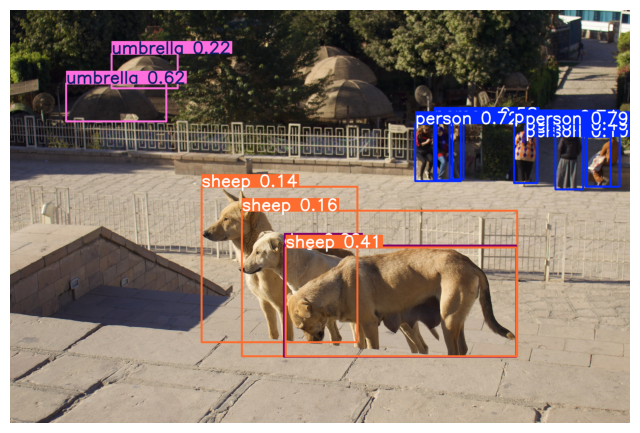

In [55]:
# TODO: Load a pretrained YOLOv8 model and run predictions on an image
model = YOLO('yolov8n.pt')          
# model = YOLO('yolov8m.pt')                        # gets it right
results = model.predict(source='dogs.JPEG', conf=0.1, show=False)
# - Visualize results with matplotlib (convert BGR->RGB if using OpenCV)
img = cv.imread('dogs.JPEG')
annotated  = results[0].plot()
annotated = cv.cvtColor(annotated, cv.COLOR_BGR2RGB)

plt.figure(figsize=(8, 8))
plt.imshow(annotated)
plt.axis('off')
plt.show()

## Task 3: YOLOv8 Training Example (Small Demo)
Choose any small dataset (e.g., from Roboflow or Kaggle) and train a YOLOv8 model for a few epochs (e.g., 3) as a demonstration. Then run predictions with the trained model.

**Why this matters:**
- Understand the end-to-end YOLO training pipeline.
- See how dataset configuration (classes, paths) connects to training code.

**Steps:**
- Prepare your dataset directory and a `data.yaml` describing train/val paths and class names.
- Train a small model (e.g., `yolov8n.pt`) for ~3 epochs.
- Run predictions on a few sample images.
- Reflect: Are the predictions what you expected? Why or why not?

**Notes:**
- Do NOT upload datasets to GitHub. Keep them locally or use a data hosting service.
- Training for 3 epochs is just for demonstration; try longer training later.
- If you can't use GPU, small images and fewer epochs help.
- If you can't use GPU, you can train your models on Kaggle or Google Colab in the future for free access to GPUs on their servers

In [81]:
# TODO: Provide path to your YOLOv8 data.yaml
# - Ensure train/val image directories and class names are correct
model = YOLO("yolov8n.pt")

In [82]:
# TODO: Train YOLOv8 for a few epochs (e.g., 3)
results = model.train(data="coco128.yaml", epochs=3, imgsz=640)
# - Save the path to best weights (runs/detect/train*/weights/best.pt)
trained_model = YOLO("runs/detect/train/weights/best.pt")
results = trained_model.predict(source=r"C:\Users\rsl_f\OneDrive\Desktop\skyxperts\tasks\yolo train", save=True)

Ultralytics 8.3.205  Python-3.13.1 torch-2.8.0+cpu CPU (13th Gen Intel Core i9-13900H)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=coco128.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=3, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrain

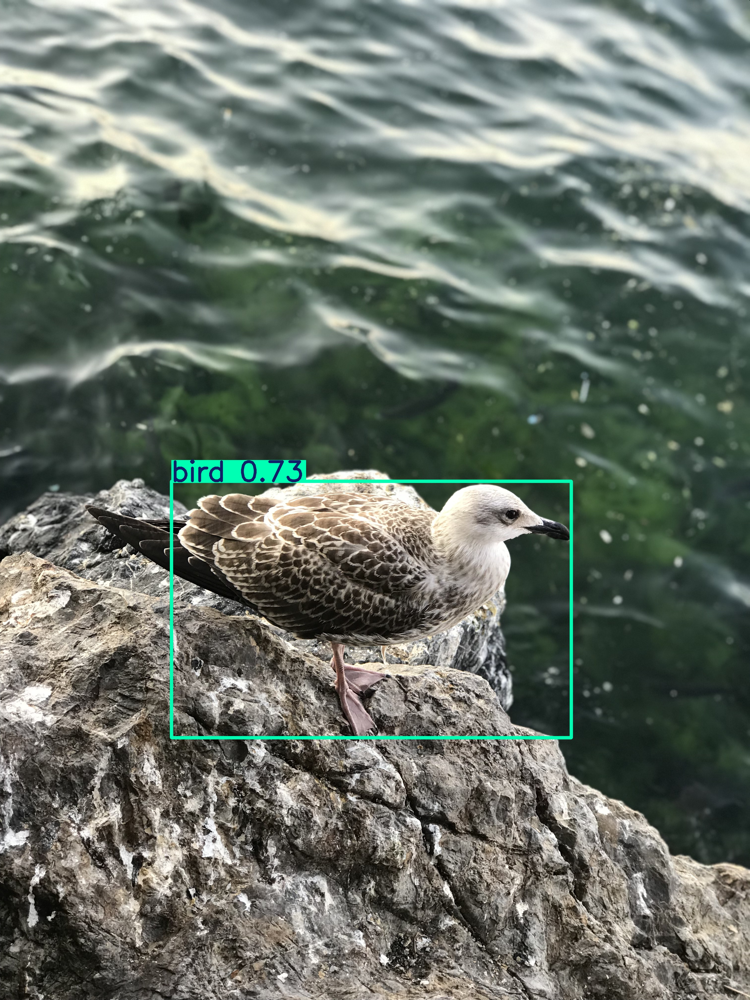

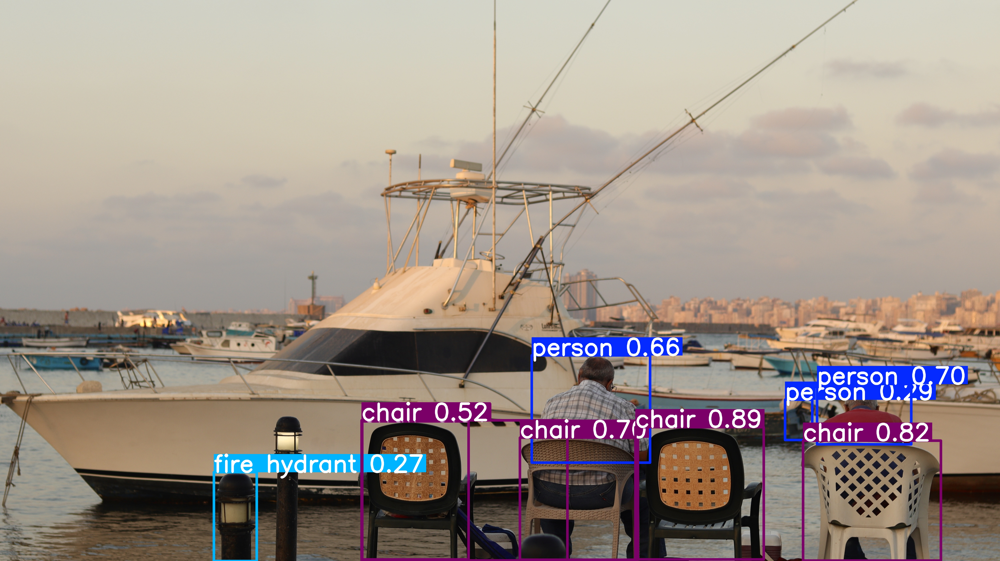

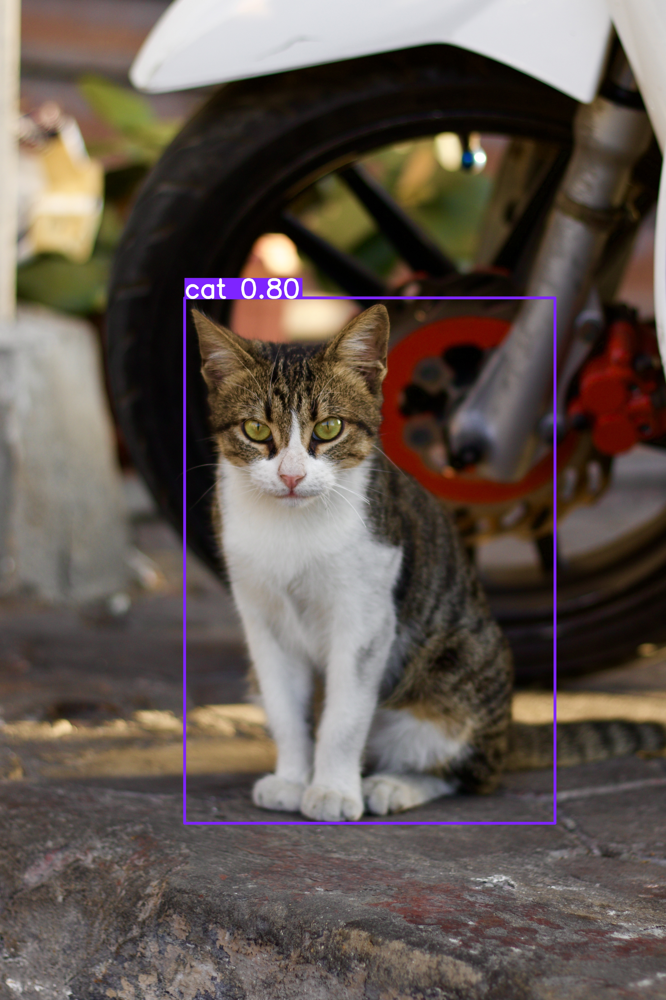

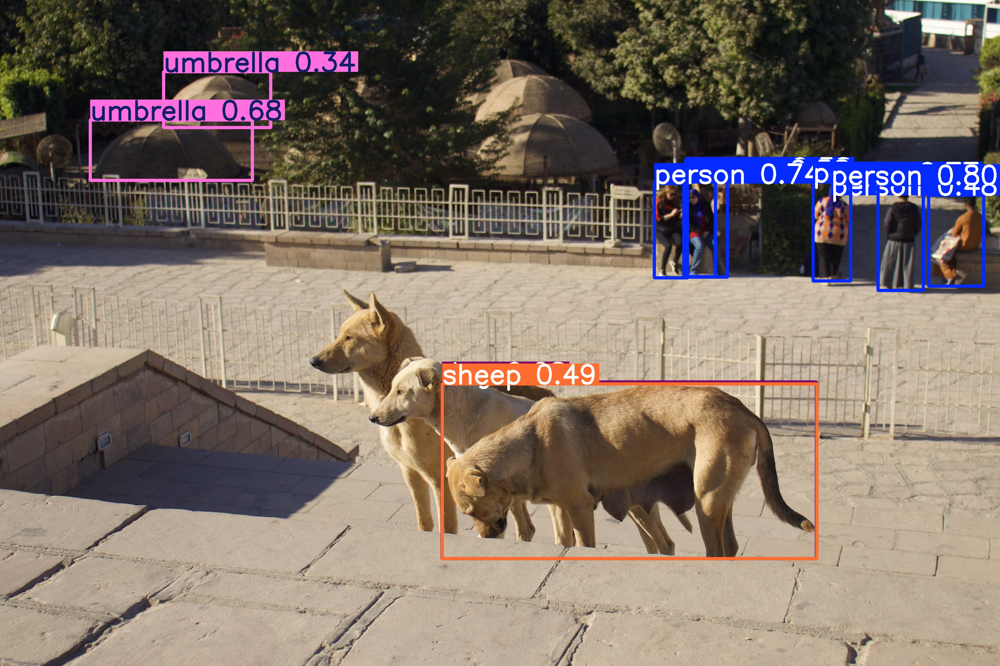

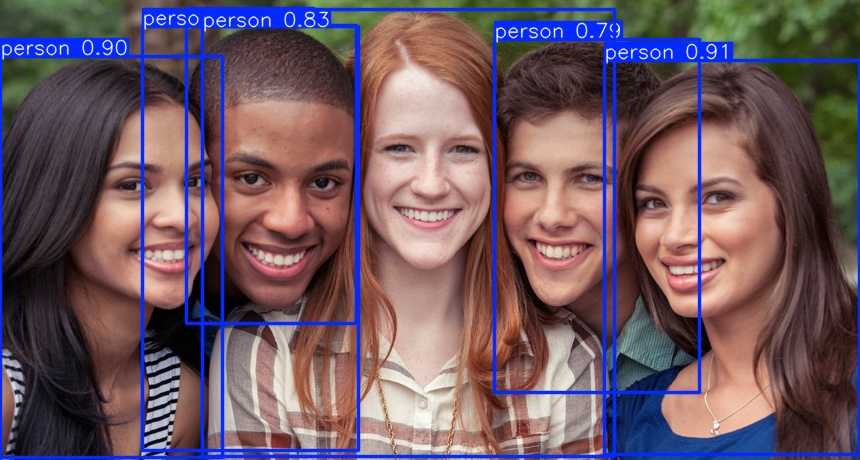

In [85]:
# TODO: Run predictions with the trained YOLO model and visualize
# - Pick one or more images and display bounding boxes/labels
from IPython.display import Image, display
import os

pred_folder = results[0].save_dir 
pred_images = [f for f in os.listdir(pred_folder) if f.lower().endswith((".jpg", ".png", ".jpeg"))]
for img_name in pred_images:
    display(Image(filename=os.path.join(pred_folder, img_name)))



### Reflection
- Are the predictions what you expected?
- If performance is weak, why? (data size/quality, epochs, augmentations, etc.)
- What would you adjust for a more serious training run?
- What other arguments can you use for the training function.